<a href="https://colab.research.google.com/github/marcinwolter/Seminars/blob/main/ModernHopfieldNetwork.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



---



---



---

# **Example of Modern Hopfield network**
Click to show the code implementing a Modern Hopfield Network.


 **Closely based on: Tom George code for TReND CaMinA, Computational Neuroscience and Machine Learning Summer School, 2024**
* Tom George: tom.george.20@ucl.ac.uk
* Links: [Twitter](https://twitter.com/TomNotGeorge), [Github](https://github.com/TomGeorge1234), [Google Scholar](https://scholar.google.com/citations?user=AG49j3MAAAAJ&hl=en)

---
## **Importing dependencies and data** <a name="dependencies"></a>
Run the following code: It'll install some dependencies, download some files and import some functions.

In [12]:
#@title Installing some stuff

import os
import pickle

#if running on colab we need to download the data and utils files

#downloads the utils functions
if os.path.exists("hopfield_networks_utils.py"): pass
#else: wget.download("https://github.com/TomGeorge1234/HopfieldNetworkTutorial/raw/main/hopfield_networks_utils.py"); print("...utils downloaded!")
else:
    !wget "https://github.com/TomGeorge1234/HopfieldNetworkTutorial/raw/main/hopfield_networks_utils.py"
    print("...utils downloaded!")

#downloafs the flags data
if os.path.exists("flags_of_africa.pickle"): pass
#else: wget.download("https://github.com/TomGeorge1234/HopfieldNetworkTutorial/raw/main/flags_of_africa.pickle"); print("...flags downloaded!")
else:
    !wget "https://github.com/TomGeorge1234/HopfieldNetworkTutorial/raw/main/flags_of_africa.pickle"
    print("...flags downloaded!")

#downloads other images used in the notebook
if os.path.isdir("./images"): pass
else:
    #wget.download("https://github.com/TomGeorge1234/HopfieldNetworkTutorial/raw/main/images.zip")
    !wget "https://github.com/TomGeorge1234/HopfieldNetworkTutorial/raw/main/images.zip"
    !unzip -o images.zip
    print("...images downloaded and unzipped!")
print("Done!")

from hopfield_networks_utils import *


Done!


---
## **First a standard Hopfield Network** <a name="hopfield"></a>

Below we provide some basic code defining a Hopfield Network class.

Suppose we initialise a network `HFN = HopfieldNetwork(random_patterns)`
<!---
**Important attributes**

* `HFN.state` is the current state of the network, a vector $s \in \mathbb{R}^{N_{\textrm{neurons}}}$
* `HFN.w` is the synpatic weight matrix.
* `HFN.patterns` is a matrix containing all the patterns in their original shape
* `HFN.N_neurons` how many neurons the network has
* `HFN.flattened_patterns` is a matrix of stored _flattened_ patterns $\Xi \in \mathbb{R}^{N_{\textrm{Patterns}} \times N_{\textrm{neurons}}}$ such that $\Xi_{n,i} \equiv \xi^{(n)}_{i}$ is the $i^{\textrm{th}}$ element of the $n^{\textrm{th}}$ pattern.
* `HFN.similarities` is a measure of similarity (a number from 0 to 1) between the current state and all saved patterns, $\textrm{sim} \in \mathbb{R}^{N_{\textrm{patterns}}}$.
* `HFN.energy` is the energy of the current state of the Hopfield network
* `HFN.history` is a dictionary containing all past `state`s,  `similarity`s and `energy`s of the network.

**Important methods**

* `HFN.update_state()`: Takes the current state and updates it $s(t) \leftarrow s(t+1)$. Then, the `state` and `similarities` are saved to history. <span style="color:red"> _[TO DO: NOT YET DEFINED]_ </span>
* `HFN.set_state(state)`: Sets the state of the network to whatever you pass as `state`. Alternatively pass HFN.set_state(random=True)` to reinitialise.
* `HFN.visualise()`: Displays the current state of the network next to a bar chart of how similar it is to all the saved patterns.
* `HFN.plot_energy(n_steps)`: Plots the evolution of the energy of the Hopfield netowrk over the past `n_steps`
* `HFN.animate(n_steps)`: Makes a short video displaying the evolution of the state of the network over the past `n_steps`

--->

In [13]:
class HopfieldNetwork(BaseHopfieldNetwork):
    """A (Modern) Hopfield Network"""
    def __init__(self,patterns_dict):

        """Initialises the Hopfield network with a set of patterns.
        Args:
            • patterns: a dictionary containing the patterns to be stored in the network labelled by their names.
            Patterns can be any shape, they will be flattened into vectors during initialisation.

        The rest of the code has already been written for us!"""
        super().__init__(patterns_dict) # all of the code has
        return

### **Complex patterns: Flags** <a name="flags"></a>

Here we've downloaded flags of all 54 African nations and converted them to greyscale.

Flags data successful loaded!


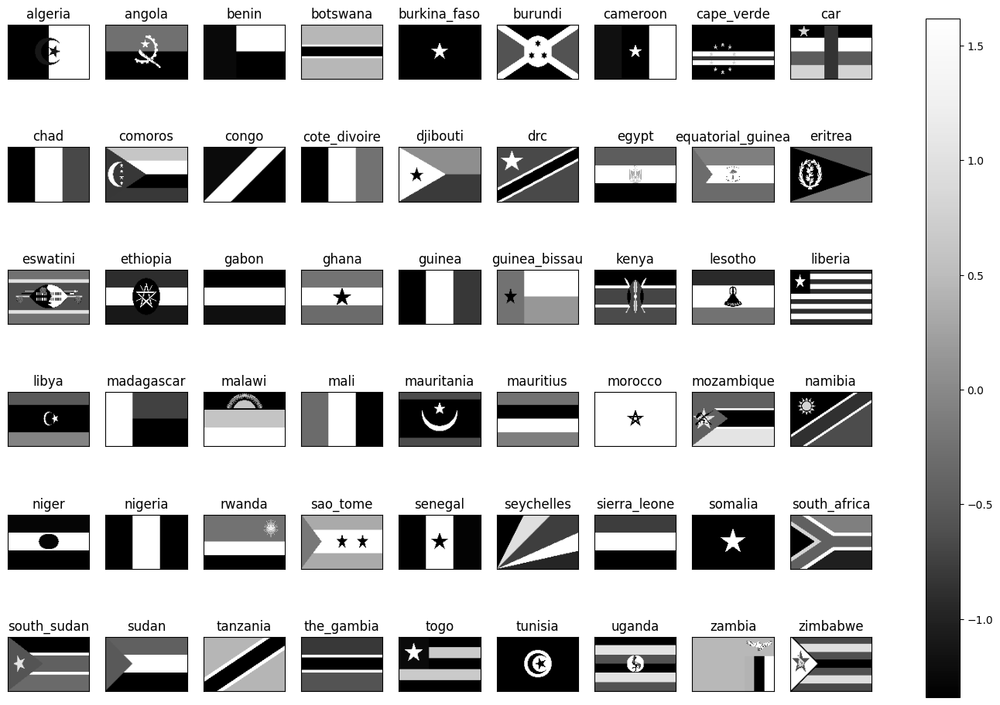

In [14]:
flags = pickle.load(open("flags_of_africa.pickle","rb"))
print("Flags data successful loaded!")
fig, ax = plot_patterns(flags)

In [15]:
# Initialise a new Hopfield network with the flags as patterns
HFN = HopfieldNetwork(flags)

n_steps: 5


(<Figure size 500x500 with 1 Axes>, <Axes: xlabel='Step', ylabel='Energy'>)

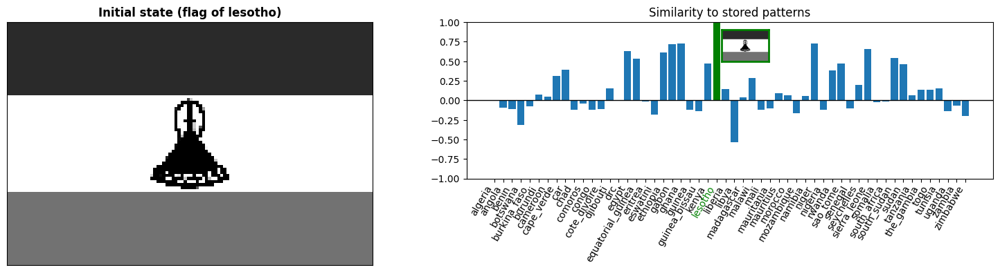

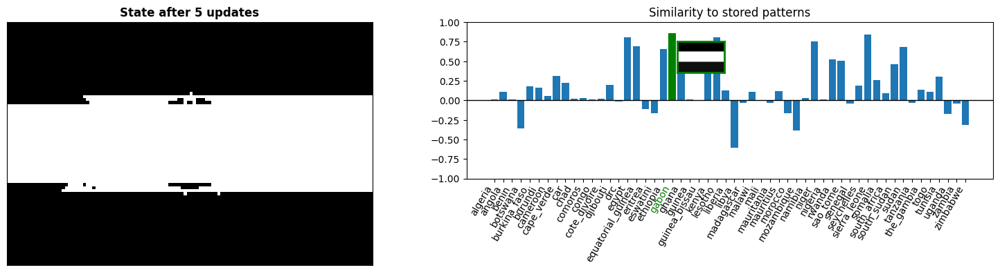

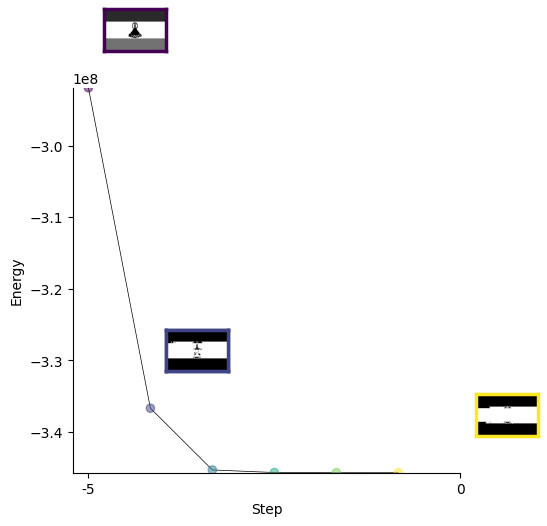

In [16]:
country = 'lesotho'
# country = 'south_africa'
# country = 'eswatini'

HFN.set_state(flags[country].flatten()) #reinitialise the state of the network
HFN.visualise(title=f"Initial state (flag of {country})")
for i in range(5):
    HFN.update_state(asynchronous=False)
HFN.visualise(title=f"State after {i+1} updates")

HFN.plot_energy(n_steps = 5)

**_📝EXERCISE_** try to run the code with another flag

#### Hmmmmm...not great. :(

Try with a few other countries.
Here's a few ideas for why the network might not perform very well at learning African flags:

* There's **too many** flags...we've exceeded the memory capacity of the network
    * Probably not. Theory tells us the capacity of a Hopfield Network is
  $N_{capacity} \approx 0.138 \times N_{neurons}$. Here there is one neuron for each pixel (150 x 100 = 15,000) and this is wayyyy bigger than the number of countries.
* The flags **aren't binary** (+1, -1) patterns.
    * This definitely doesn't help but the problems are more fundamental: patterns get corrupted, not just binarised.
* The flags are **too correlated**
    * This is probably it! Classical Hopfield Network theory only holds for _uncorrelated random_ patterns. But flags are very correlated (i.e. greyscale Cote d'Ivore ~ Guinea) and not random (all contain a lot of structure e.g. strips, stars etc. )
    
**_📝EXERCISE_** Try and run the code above using _your_ countries flag and then some others. Which countries flags are hardest to learn? Which are easier?

---

## **Modern Hopfield Networks** <a name="modern"></a>

I turns out its possible to improve the performance of Hopfield networks switching to modern Hopfield networks.

<!---
_Modern Hopfield Networks_ have a slightly modified energy and update function compared to _Classical Hopfield Networks_

| | **Classic** | **Modern** |
| ----------- | ----------- | ----------- |
| **Update rule** | $ \vec{s} \leftarrow \textrm{sign}\big(\underbrace{\vec{\xi}\vec{\xi}^{\mathsf{T}}}_{\mathsf{w}}\vec{s}\big)$ | $\vec{s} \leftarrow \vec{\xi} \textrm{softmax}(\beta \vec{\xi}^{\mathsf{T}}\vec{s})$ |
| **Energy function** | $ E(\vec{s}) = \vec{s}^{\mathsf{T}}\underbrace{\vec{\xi}\vec{\xi}^{\mathsf{T}}}_{\mathsf{w}}\vec{s}$ | $E(\vec{s}) = -\textrm{lse}\big(\vec{\xi}^{\mathsf{T}}\vec{s}\big) + \frac{1}{2} \vec{s}^{\mathsf{T}}\vec{s}$ |

where softmax and lse are smooth continuous functions. You don't need to understand these functions or these equations except to realise that

* It's just another way to update networks of neurons. In both cases, the udates and energy of the network depend on
    * The state of the network, $\vec{s}$
    * The patterns, $\vec{\xi}$ (in the _classic_ case we used these to define a new quantity called the weight matrix $\mathsf{w} = \vec{\xi}\vec{\xi}^{\mathsf{T}}$

--->

This class inherits from our original `HopfieldNetwork` class so we can use all the same plotting functions

In [17]:
class ModernHopfieldNetwork(HopfieldNetwork):
    def __init__(self,patterns,beta=0.01):
        self.beta=beta
        super().__init__(patterns)

    def update_state(self):
        """This is the ONLY difference between ModernHopfieldNetwork and HopfieldNetwork. Igt has a slightly different update rule.
        Note the use of a softmax function to make the network dynamics more continuous"""

        self.state += 0.1 * (self.flattened_patterns.T @  softmax(self.beta * self.flattened_patterns @ self.state) - self.state)
        self.similarities = self.get_similarities()
        self.energy = self.get_energy()
        self.save_history()

    def get_energy(self,state=None):
        """Modern Hopfield Networks have slightly different energy functions. You can ignore this function for now."""
        state = self.state if state is None else state
        return -log_sum_exp(self.flattened_patterns @ state, beta=self.beta) + 0.5 * state @ state

In [18]:
MHFN = ModernHopfieldNetwork(flags,
                             beta=0.05, #the "inverse temperature"
                            )

n_steps: 50


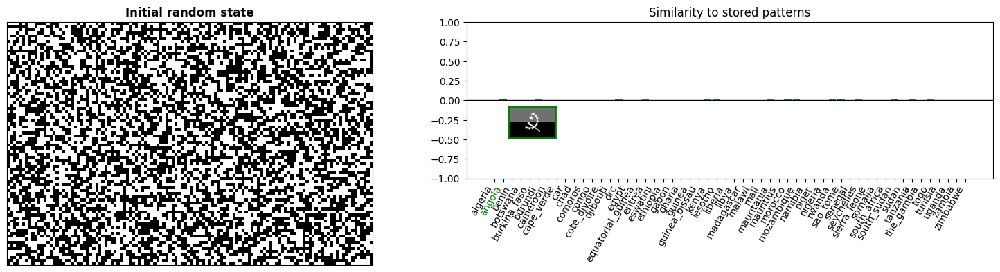

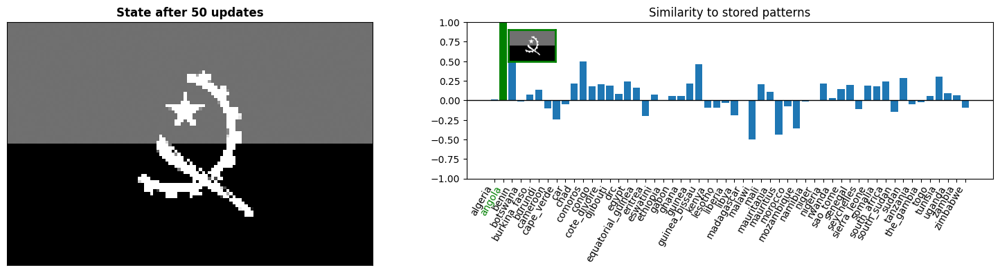

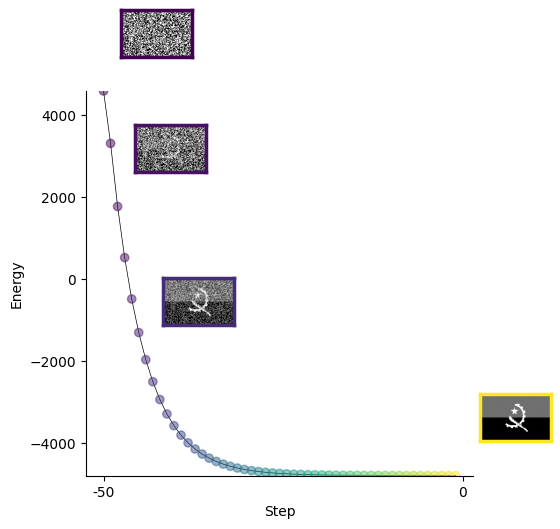

In [19]:
MHFN.set_state(random=True) #reinitialise the state of the network
MHFN.visualise(title=f"Initial random state")
for i in range(50):
    MHFN.update_state()
MHFN.visualise(title=f"State after {i+1} updates")
fig, ax = MHFN.plot_energy(n_steps=i+1)

## **Partially masked flag of Nigeria**

In [20]:
country = "nigeria"
masked_flag = mask_pattern(flags[country])# your code here
MHFN.set_state(masked_flag)
#now update the Modern Hopfield Network for 20 states
for i in range(20):
    MHFN.update_state()

MHFN.animate(n_steps=20)

### **Flag Championship!!** <a name="flag-championship"></a>

Nigeria 🇳🇬 and Ghana 🇬🇭 have long argued over who has the best jollof rice. Algeria 🇩🇿 and Tunisia 🇹🇳 over who has the best couscous. Cameroon 🇨🇲 and Egypt 🇪🇬 over who has the best football team.

Can we settle these debates once and for all? Probably not.

Can we add computational neuroscience inspired fuel to the fire? Probably! 🔥

The `merge_pattterns(pattern1, pattern2)` function combines two pattern (half on the left half on the right).

If we initialise the network in this merged state, which flag will network converge to? Only dynamics will tell...


In [21]:
country1 = 'eswatini'
country2 = 'mauritania'

merged_flag = merge_patterns(flags[country1],flags[country2])

MHFN = ModernHopfieldNetwork(flags)
MHFN.set_state(merged_flag)
MHFN.visualise(title=f"Initial state (merged flags of {country1} and {country2})")
for i in range(50):
    MHFN.update_state()

MHFN.animate(n_steps=50)

In [22]:
#test which is most similar
flag_names = np.array(list(flags.keys()))
country1_score, country2_score = MHFN.similarities[flag_names == country1][0], MHFN.similarities[flag_names == country2][0]
print(f"The winner is....{country1.upper() if country1_score > country2_score else country2.upper()}!")

The winner is....ESWATINI!
